# Atelier data quality and data processing 

Realised by <br>
HOUARI Mourtada <br>
KASMI Ghilas

In [2]:
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score
from sklearn.model_selection import train_test_split, GridSearchCV
from tensorflow.keras.utils import to_categorical
from sklearn.cluster import KMeans, DBSCAN
from currency_converter import CurrencyConverter
from sklearn.preprocessing import LabelEncoder
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
import pandas as pd
import matplotlib.pyplot as plt
import pycountry
import string



# Read the dft
[Manager salary survey 2021](https://docs.google.com/spreadsheets/d/1IPS5dBSGtwYVbjsfbaMCYIWnOuRmJcbequohNxCyGVw/edit?resourcekey#gid=1625408792)

We read the dfand use custom column names to simplify the manipulation of our df

The dfset is a mix of numerical and textual df so first we have to explore it, compute its statistical properties then to determine among the features it includes which ones are interesting to keep and which ones we should remove.

We visualize unique vs null value counts in our dft, these will allow us to know beforehand which are the columns to get rid of and which ones are representing categorical data. Columns having low value for unique property represent categorical data and those which have high value for nulls are useless so we can not to use them

DF Head: 
            timestamp    age                          field  \
0  4/27/2021 11:02:10  25-34   Education (Higher Education)   
1  4/27/2021 11:02:22  25-34              Computing or Tech   
2  4/27/2021 11:02:38  25-34  Accounting, Banking & Finance   
3  4/27/2021 11:02:41  25-34                     Nonprofits   
4  4/27/2021 11:02:42  25-34  Accounting, Banking & Finance   

                                        job jobContext  salary  \
0        Research and Instruction Librarian        NaN  55,000   
1  Change & Internal Communications Manager        NaN  54,600   
2                      Marketing Specialist        NaN  34,000   
3                           Program Manager        NaN  62,000   
4                        Accounting Manager        NaN  60,000   

   monitaryCompensation currency currency2 currencyContext         country  \
0                   0.0      USD       NaN             NaN   United States   
1                4000.0      GBP       NaN             NaN

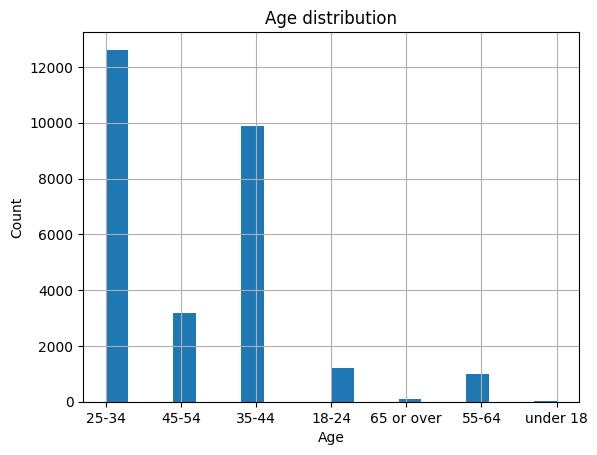

<Axes: title={'center': 'Unique vs Null values distribution'}>

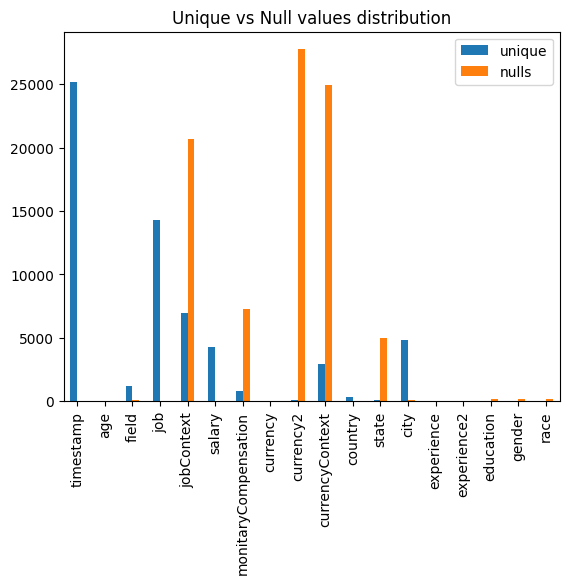

In [3]:
column_names = ['timestamp', 'age', 'field', 'job', 'jobContext', 'salary', 'monitaryCompensation', 'currency', 'currency2',
          'currencyContext', 'country', 'state', 'city', 'experience', 'experience2', 'education', 'gender', 'race']

df = pd.read_csv('salaries.csv', sep=',', header=0, names=column_names)

print('DF Head: ')
print(df.head())
print()

print('DF shape is: ')
print(df.shape)
print()

print('DF Description: ')
print(df.describe())
print()

print('Uniques values: ')
print(df.nunique())
print()

print('DF Sum of null values: ')
print(df.isnull().sum())

df['age'].hist(bins=20)
plt.title('Age distribution')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()


unique_values_count = df.nunique()
null_values_count = df.isna().sum()
un = pd.DataFrame(data={'unique': unique_values_count, 'nulls': null_values_count})
un.plot(y=['unique', 'nulls'], kind='bar', title='Unique vs Null values distribution')

# Data Cleaning

## Cleaning country names
We normalize the country names using the country_converter library that exposes functions that allow to unify the representation of countries.

For every country, despite of its initial presentation being a whole name or three letters code, we use the library to get the ISO Code for each one of them 

In [4]:
currency_converter = CurrencyConverter()

df.replace('AUD/NZD', 'AUD', inplace=True)

def fix(row):
    
    try:
        row['country_name'] = pycountry.countries.search_fuzzy(row['country'])[0].name
    except:
        row['country_name'] = None
        
    row['salary'] = int(row['salary'].replace(",", ""))
    s = row['salary']
    c = row['currency']
    try:
        if(c == 'Other' or row['country_name'] == 'Colombia'):
            c = row['currency2']
            
        ns = currency_converter.convert(s, c, 'USD')
        row['salary_usd'] = int(ns)
        
    except:
        row['salary_usd'] = None
        
    return row

df = df.apply(fix, axis=1)
df = df[df['salary_usd'] > 500]


# Create salary categories

In [5]:
salary_categories = [0, 29999, 69999, 109999 ,float('inf')]  # Modify the salary ranges as per your needs
category_labels = ['low', 'medium', 'high', 'very heigh']
df['salary_category'] = pd.cut(df['salary_usd'], bins=salary_categories, labels=category_labels)

# Field and gender unification

In [6]:
industries = [
    'Accounting, Banking & Finance',
    'Agriculture or Forestry',
    'Art & Design',
    'Business or Consulting',
    'Computing or Tech',
    'Education (Primary/Secondary)',
    'Education (Higher Education)',
    'Engineering or Manufacturing',
    'Entertainment',
    'Government and Public Administration',
    'Health care',
    'Hospitality & Events',
    'Insurance',
    'Law',
    'Law Enforcement & Security',
    'Leisure, Sport & Tourism',
    'Marketing, Advertising & PR',
    'Media & Digital',
    'Nonprofits',
    'Property or Construction',
    'Recruitment or HR',
    'Retail',
    'Sales',
    'Social Work',
    'Transport or Logistics',
    'Utilities & Telecommunications'
]


for x in df['gender']:
    if x not in ["Man", "Woman"]:
        df.replace(x, "Other", inplace=True)
        
for x in df['field']:
    if x not in industries:
        df.replace(x, "Other", inplace=True)
        

### General data cleaning
- With the bar chart we've got from the first step, we can easilly figure out which columns we should remove, and these columns are: Job Context, Currency 2, Currency Context. We can define a threshold from which we determine whether to keep or to remove a column. We can set it to 50% since columns having null count below these value can be filled out.
- The columns still having null values after this step should be filled up with values appropriate to each column signification, we use the unique values information to determine how to do it.
- The state and city are useless for instance for our analysis, they don't hold an important information that can improve the results we'll get as a resolution to the problem we trying to solve

In [ ]:
df.drop(labels=['monitaryCompensation', 'experience2', 'jobContext', 'currency2', 'currency', 'country', 'currencyContext', 'salary'], axis=1, inplace=True)
df.dropna(axis=1, thresh=df.shape[0]/2, inplace=True)
df.fillna({'gender': 'Other or prefer not to answer', 'race': 'Other', 'education': 'Other'}, inplace=True)


# Text Data Preprocessing
In order to benefits from textual data, most algorithm need them to be standardised or even numerised. To do so, we first tokenize our data, remove useless tokens which carries no information like punctuation, apply case folding, lemmatization, then delete stopwords before reassembling the tokens.

Note that all our textual data doesn't need these steps, indeed some columns (race, experience, experience2, education, gender, currency and age) follows strict rules and are distributed a small and precise number on possible values. We can numerise them without any preprocessing.

Meanwhile other columns are messy, often countains redundant values with differents spelling, spelling mistake, acronyms, case differences, ..
These data must be standardized before numerising them.
After doing so, we can have a look at their data distribution, while some of them are completely fine, some others looks distrurbing, like for example country column which has 97% of its rows value equals USA. These columns may not be pertinent : We need to ask ourselves if we really need theses columns or we should just drop them. 

In [10]:
PUNCT_TO_REMOVE = string.punctuation
def remove_punctuation(text):
    return str(text).translate(str.maketrans('', '', PUNCT_TO_REMOVE))

STOPWORDS = set(stopwords.words('english'))
def remove_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in STOPWORDS])

stemmer = PorterStemmer()
def stem_words(text):
    return " ".join([stemmer.stem(word) for word in text.split()])

lemmatizer = WordNetLemmatizer()
def lemmatize_words(text):
    return " ".join([lemmatizer.lemmatize(word) for word in text.split()])

df["job"] = df["job"].str.lower()
df["field"] = df["field"].str.lower()

df["job"] = df["job"].apply(lambda text: remove_punctuation(text))
df["field"] = df["field"].apply(lambda text: remove_punctuation(text))

df["job"] = df["job"].apply(lambda text: remove_stopwords(text))
df["field"] = df["field"].apply(lambda text: remove_stopwords(text))

df["job"] = df["job"].apply(lambda text: stem_words(text))
df["field"] = df["field"].apply(lambda text: stem_words(text))

df["job"] = df["job"].apply(lambda text: lemmatize_words(text))
df["field"] = df["field"].apply(lambda text: lemmatize_words(text))

df.head()

,timestamp,age,field,job,state,city,experience,education,gender,race,country_name,salary_usd,salary_category
0,4/27/2021 11:02:10,25-34,educ higher educ,research instruct librarian,Massachusetts,Boston,5-7 years,Master's degree,Woman,White,United States,55000.0,medium
1,4/27/2021 11:02:22,25-34,comput tech,chang intern commun manag,Other,Cambridge,8 - 10 years,College degree,Other,White,United Kingdom,67844.0,medium
2,4/27/2021 11:02:38,25-34,account bank financ,market specialist,Tennessee,Chattanooga,2 - 4 years,College degree,Woman,White,United States,34000.0,medium
3,4/27/2021 11:02:41,25-34,nonprofit,program manag,Wisconsin,Milwaukee,8 - 10 years,College degree,Woman,White,United States,62000.0,medium
4,4/27/2021 11:02:42,25-34,account bank financ,account manag,South Carolina,Greenville,8 - 10 years,College degree,Woman,White,United States,60000.0,medium


# Data exploration and visualization
We'll perform multiple task in order to better understand the dataset, we'll try to understand how the salaries changes based on the country, the work field. We'll also have a look at the data distribution


## Respondent distribution by field

Now we check the repartition of the availible data depending on the previously defined work fields

In [12]:
import plotly.express as px

df_jobs = df.groupby('field')['timestamp'].count().reset_index(name='count').sort_values(by='count', ascending=False).head(20)
fig = px.histogram(df_jobs, x="field",y='count' , nbins=20, marginal="box", title='Respondents distribution by field')
fig.show()



## Mean salary distribution by field

Now we compute then plot the mean salary depending on the previously defined work fields

In [13]:
df_salary = df.groupby(df['field'])['salary_usd'].mean().reset_index(name='mean')
fig = px.histogram(df_salary, x="field",y='mean' , nbins=20, marginal="box", title='Average salary distribution by field')
fig.show()

## Respondent distribution by country

Now we'll look at the different countries present in the dataset.
The gray countries are not represented in the dataset.
Other countries are all represented in the same proportions, excepts for USA which is way more present than the any country. We should take into consideration that the USA salary specificities may affect the general results.


In [14]:
country_count = df.groupby(['country_name']).size().reset_index(name='count')

# Create a choropleth map of respondent distribution by country
country_map = px.choropleth(country_count, locations='country_name', locationmode='country names', color='count',
                            title='Respondent distribution by country')
country_map.show()

## Average Salary distribution by country

Now plot the mean salary for each country on a world map.
We can see that the salaries varies a lot depending on the country. So if we want to extract information or laws on other factors than country, we should consider taking data only from one country at a time/ normalize the data in a way salary discrepancies does not affect the final view.

In [15]:
salary_mean = df.groupby(['country_name'])['salary_usd'].mean().reset_index(name='mean')

# Create a choropleth map of respondent distribution by country
salary_map = px.choropleth(salary_mean, locations='country_name', locationmode='country names', color='mean',
                            title='Average Salary distribution by country')
salary_map.show()

# Keep only pertinant columns to run algorithms
In our dataset, we have multiple columns that are not representative of any valuable informations. For example, we're not trying to learn any information related to the city so we can drop it. We'll do the same for timestamp, salary_category and salary_usd (these will be the result of the learning we want), job (the exact job title) and state.
It's important to note that these columns may be important in a different use case (for example, we'll certainly need timestamp if we had to study the effect of inflation on the salaries), but in our case we only try to understand and predict the salary based on other caracteristics ( timestamp would be maybe be useful if we had a wider time coverage ).


In [19]:
y = df['salary_category']
yy = df['salary_usd']
df = df.drop(['timestamp','salary_category', 'salary_usd', 'job', 'state', 'city'], axis=1)

df.dropna(inplace=True)
df.head()


,age,field,experience,education,gender,race,country_name
0,25-34,educ higher educ,5-7 years,Master's degree,Woman,White,United States
1,25-34,comput tech,8 - 10 years,College degree,Other,White,United Kingdom
2,25-34,account bank financ,2 - 4 years,College degree,Woman,White,United States
3,25-34,nonprofit,8 - 10 years,College degree,Woman,White,United States
4,25-34,account bank financ,8 - 10 years,College degree,Woman,White,United States


# Encode data

Most of the data left is ordinal or categorical data, we cannot perform our learning on those.
So we'll encode each label into a numeric value.

In [20]:
# Encode categorical variables
categorical_columns = ['age', 'field', 'experience', 'education', 'gender', 'race', 'country_name']
label_encoders = {}
for column in categorical_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column])
    label_encoders[column] = le

X = df

le = LabelEncoder()
y = le.fit_transform(y)
y = to_categorical(y)
data_encoded = pd.get_dummies(df, columns=categorical_columns)


# Decision Tree
Here we have multiple salary categories, we want to know to which salary category each person belongs. This is a basic classification task and our data is not linearly separable, let's first try to use a Decision Tree model to classify it.

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = DecisionTreeClassifier()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")


Accuracy: 0.41068537506745817


The results are quite bad. the model didn't catch enough informations.
<br>

# Model selection
The previous model was not enough to learn from the data. We'll try more complex models.
First, let's go with Random Forest and Gradient Boosting classifiers, but instead of trying manually different hyperparameters we'll implement a loop to run multiple instances of the models, and then return the best combination model-parameters for each classifier.

In [72]:
# Define a list of models to explore
models = [
    RandomForestClassifier(),
    GradientBoostingClassifier()
]

# Define a grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, None]
}

# Perform grid search and cross-validation for each model
best_model = None
best_accuracy = 0

for model in models:
    grid_search = GridSearchCV(model, param_grid, cv=5)
    grid_search.fit(X_train, y_train)
    
    # Evaluate the model
    y_pred = grid_search.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    
    # Check if this model has the best accuracy so far
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_model = grid_search.best_estimator_
    
    # Print the model's performance
    print(f"Model: {model.__class__.__name__}")
    print(f"Best Parameters: {grid_search.best_params_}")
    print(f"Accuracy: {accuracy}")
    print()

# Use the best model for predictions
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Best Model: {best_model.__class__.__name__}")
print(f"Accuracy: {accuracy}")


Model: RandomForestClassifier
Best Parameters: {'max_depth': None, 'n_estimators': 200}
Accuracy: 0.5321100917431193

Model: GradientBoostingClassifier
Best Parameters: {'max_depth': 3, 'n_estimators': 300}
Accuracy: 0.5594531390537867

Best Model: GradientBoostingClassifier
Accuracy: 0.5594531390537867


The accuracy is already better, but not really optimal.

# Linear regression
Let's now check the salaries exact numbers.
We have multiple numeric salaries, depending on multiple criterias. This looks like a regression problem.
Let's first try a linear approach.


In [22]:
X_train, X_test, y_train, y_test = train_test_split(X, yy, test_size=0.2, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")


Mean Squared Error: 4397744822.471763
R-squared: 0.06905217862576296


We can clearly see that this model does not fit the data at all. As we already noticed it in the previous part, the daat is not linear. We have to try a more complex algorithm.

# Neural network
Let's try a neural network approach.

In [23]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create the neural network model
model = Sequential()
model.add(Dense(64, activation='relu', input_shape=(X_train.shape[1],)))
model.add(Dense(32, activation='relu'))
model.add(Dense(len(le.classes_), activation='softmax'))
# Compile the model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Set up early stopping
early_stopping = EarlyStopping(patience=5, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Accuracy: {accuracy}")

# Make predictions
y_pred = model.predict(X_test)


Epoch 1/20
695/695 [==============================] - 4s 4ms/step - loss: 1.4882 - accuracy: 0.3937 - val_loss: 1.2000 - val_accuracy: 0.4576
Epoch 2/20
695/695 [==============================] - 3s 4ms/step - loss: 1.1861 - accuracy: 0.4223 - val_loss: 1.1280 - val_accuracy: 0.4555
Epoch 3/20
695/695 [==============================] - 3s 4ms/step - loss: 1.1673 - accuracy: 0.4285 - val_loss: 1.1395 - val_accuracy: 0.4526
Epoch 4/20
695/695 [==============================] - 3s 4ms/step - loss: 1.1639 - accuracy: 0.4325 - val_loss: 1.1557 - val_accuracy: 0.4616
Epoch 5/20
695/695 [==============================] - 3s 5ms/step - loss: 1.1550 - accuracy: 0.4307 - val_loss: 1.1330 - val_accuracy: 0.4267
Epoch 6/20
695/695 [==============================] - 3s 4ms/step - loss: 1.1480 - accuracy: 0.4385 - val_loss: 1.1235 - val_accuracy: 0.4659
Epoch 7/20
695/695 [==============================] - 3s 4ms/step - loss: 1.1460 - accuracy: 0.4356 - val_loss: 1.1131 - val_accuracy: 0.4638
Epoch 

# Dimensionality Reduction and Manifold Learning 
In order to reduce the data dimensions, we could use multiple algorithms, PCA is a solid choice, we could also use LLE, MDS or TSNE.

After computing the first principal component, we can see that it represent 55.18% of the available data, which mean most our data are corelated, but it also make it less readable and difficult to interpret. Indeed, when we look at the 2D representation of the result, we can see that the 2nd dimension doesn't affect that much our data, same for the third. The good point tho is because we can reduce it this effectively, the algorithms we run on these data may run smoothly.


In [101]:
pca = PCA(n_components=3, whiten=True)
principalComponents_data = pca.fit_transform(data_encoded)

print(pca.explained_variance_)
X_reconstructed = pca.inverse_transform(principalComponents_data)
reconstruction_error = mean_squared_error(data_encoded, X_reconstructed)
print("Reconstruction error:", reconstruction_error)


fig = px.scatter_3d(principalComponents_data, x=0, y=1, z=2, color=yy)
fig.update_layout(title='PCA Visualization in 3D')
fig.show()


[0.55183024 0.39362082 0.33089522]
Reconstruction error: 0.014350099482146661


In [69]:
categories = {'low': 1, 'medium': 2, 'high': 3, 'very heigh': 4}
y = pd.read_csv('cleaned_data')['salary_category']
yy = [categories[d] for d in y]


# DBSCAN over pca
Here we tried to cluster the reduced data using DBSCAN aiming to remove some of the noisy data. As we can see in the following illustration, there is three main regions in the data which represents the most frequent categories(heigh, medium and very heigh). The fourth can be considered as outliers because it represents the category low which also have the lowest frequency.

In [105]:
dbscan = DBSCAN(eps=0.5, min_samples=100)
dbscan.fit(principalComponents_data)
cluster_labels = dbscan.labels_


fig = px.scatter_3d(principalComponents_data, x=0, y=1, z=2, color=cluster_labels)
fig.update_layout(title='PCA Visualization in 3D')
fig.show()



# Manifold learning t-SNE

The objective of t-SNE is to visualize the data in a lower-dimensional space (in this case 3D) while preserving the local structure of the data points.

Here t-SNE does not perform well on the dataset, the patterns of the data, the relationships between the clusters are not revealed as the previous visulaizations 

In [97]:
# Extract the features for manifold learning
X = df
tsne = TSNE(n_components=3, random_state=42, perplexity=10)
X_tsne = tsne.fit_transform(X)

# Plot the data points in the reduced 2D space
fig = px.scatter_3d(X_tsne, x=0, y=1, z=2, color=yy)
fig.update_layout(title='Manifold t-SNE Visualization in 3D')
fig.show()
